In [1]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
from IPython.display import clear_output
from torch import nn, optim
from torchvision import transforms
from tqdm.auto import tqdm
import PIL
from torchvision import datasets, models

warnings.filterwarnings("ignore")
%matplotlib inline

device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [2]:
image_size = 256
data_transform = transforms.Compose([
        transforms.Resize(size = (image_size, image_size)),
        #transforms.CenterCrop(256),
        transforms.ColorJitter(hue=0.05, saturation=0.05),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(20, interpolation=PIL.Image.BILINEAR),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
default_data_transform = transforms.Compose([
        transforms.Resize(size = (image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])

In [3]:
def get_dataset(data_dir):
    # create train and test datasets
    train_dataset = datasets.ImageFolder(data_dir + '/train',
                                              data_transform)
    test_dataset = datasets.ImageFolder(data_dir + '/val',
                                              default_data_transform)
    trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=16,
                                                 shuffle=True, num_workers=1)
    testloader = torch.utils.data.DataLoader(test_dataset, batch_size=48,
                                                 shuffle=False, num_workers=1)
    dataset_sizes = {'train': len(train_dataset), 'test': len(test_dataset)}
    #get classes from train dataset folders name
    classes = train_dataset.classes

    return trainloader, testloader, classes, dataset_sizes

In [12]:
train_dataloader, val_dataloader, classes, dataset_sizes = get_dataset("/content/drive/MyDrive/plant_diseases_5")

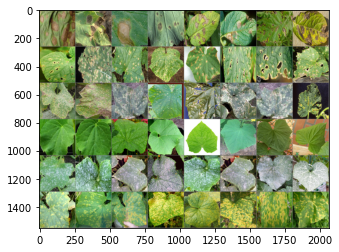

Альтернариоз Альтернариоз Альтернариоз Альтернариоз Альтернариоз Альтернариоз Альтернариоз Альтернариоз Антракноз Антракноз Антракноз Антракноз Антракноз Антракноз Антракноз Антракноз Бактериоз Бактериоз Бактериоз Бактериоз Бактериоз Бактериоз Бактериоз Бактериоз Здоровые Здоровые Здоровые Здоровые Здоровые Здоровые Здоровые Здоровые Мучнистая_роса Мучнистая_роса Мучнистая_роса Мучнистая_роса Мучнистая_роса Мучнистая_роса Мучнистая_роса Мучнистая_роса Пероноспороз Пероноспороз Пероноспороз Пероноспороз Пероноспороз Пероноспороз Пероноспороз Пероноспороз


In [ ]:
def imshow(img):
    img = img / 2+0.5      # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()
# get some random training images
dataiter = iter(val_dataloader)
images, labels = next(dataiter)
#images, labels = dataiter.next()
# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(len(images))))

Здоровые Здоровые Антракноз Мучнистая_роса Пероноспороз Пероноспороз Мучнистая_роса Альтернариоз Бактериоз Здоровые Альтернариоз Пероноспороз Пероноспороз Бактериоз Пероноспороз Антракноз


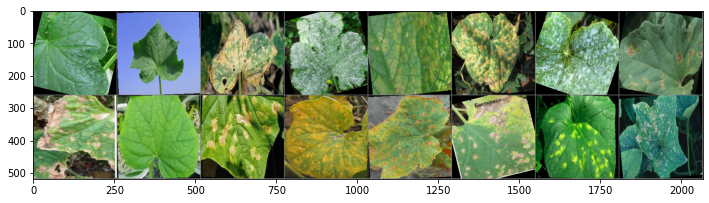

In [ ]:
def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

images, labels = next(iter(train_dataloader))

plt.figure(figsize=(12, 12))
# create grid of images
img_grid = torchvision.utils.make_grid(images)
# show images
matplotlib_imshow(img_grid, one_channel=False)
print(' '.join('%5s' % classes[labels[j]] for j in range(len(images))))

In [13]:
def plot_history(train_history, val_history, title="loss"):
    plt.figure()
    plt.title(title)
    plt.plot(train_history, label="train", zorder=1)

    points = np.array(val_history)
    steps = list(
        range(0, len(train_history) + 1, int(len(train_history) / len(val_history)))
    )[1:]

    plt.scatter(
        steps, val_history, marker="+", s=180, c="orange", label="val", zorder=2
    )
    plt.xlabel("train steps")

    plt.legend(loc="best")
    plt.grid()

    plt.show()

In [14]:
def train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=100):
    train_loss_log, train_acc_log, val_loss_log, val_acc_log = [], [], [], []

    for epoch in range(n_epochs):
        # тренировка
        train_epoch_loss, train_epoch_true_hits = torch.empty(0), torch.empty(0)
        model.train()
        for imgs, labels in tqdm(
            train_dataloader, desc=f"Training, epoch {epoch}"#, leave=False
        ):
            imgs, labels = imgs.to(device), labels.to(device)

            y_pred = model(imgs)
            loss = criterion(y_pred, labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            # log loss for the current epoch and the whole training history
            train_epoch_loss = torch.cat(
                (train_epoch_loss, loss.cpu().unsqueeze(0) / labels.cpu().size(0))
            )
            train_loss_log.append(loss.cpu().data / labels.cpu().size(0))

            # log accuracy for the current epoch and the whole training history
            pred_classes = torch.argmax(y_pred.cpu(), dim=-1)
            train_epoch_true_hits = torch.cat(
                (
                    train_epoch_true_hits,
                    (pred_classes == labels.cpu()).sum().unsqueeze(0),
                )
            )
            train_acc_log.append(
                (pred_classes == labels.cpu()).sum() / labels.cpu().shape[0]
            )
        scheduler.step()

        # валидация
        val_epoch_loss, val_epoch_true_hits = torch.empty(0), torch.empty(0)
        model.eval()
        with torch.no_grad():
            for imgs, labels in tqdm(
                val_dataloader, desc=f"Validating, epoch {epoch}", leave=False
            ):
                imgs, labels = imgs.to(device), labels.to(device)

                y_pred = model(imgs)
                loss = criterion(y_pred, labels)
                val_epoch_loss = torch.cat(
                    (val_epoch_loss, loss.cpu().unsqueeze(0) / labels.cpu().size(0))
                )

                pred_classes = torch.argmax(y_pred.cpu(), dim=-1)
                val_epoch_true_hits = torch.cat(
                    (
                        val_epoch_true_hits,
                        (pred_classes == labels.cpu()).sum().unsqueeze(0),
                    )
                )

        val_loss_log.append(val_epoch_loss.mean())
        val_acc_log.append(
            val_epoch_true_hits.sum()
            / val_epoch_true_hits.size(0)
            / val_dataloader.batch_size
        )
        
        if epoch % 10 == 0:
            clear_output()
            plot_history(train_loss_log, val_loss_log, "loss")
            plot_history(train_acc_log, val_acc_log, "accuracy")

            print("Train loss:", train_epoch_loss.mean().item())
            print(
                "Train acc:",
                (
                    train_epoch_true_hits.sum()
                    / train_epoch_true_hits.size(0)
                    / train_dataloader.batch_size
                ).item(),
            )
            print("Val loss:", val_epoch_loss.mean().item())
            print(
                "Val acc:",
                (
                    val_epoch_true_hits.sum()
                    / val_epoch_true_hits.size(0)
                    / val_dataloader.batch_size
                ).item(),
            )
    clear_output()
    plot_history(train_loss_log, val_loss_log, "loss")
    plot_history(train_acc_log, val_acc_log, "accuracy")

    print("Train loss:", train_epoch_loss.mean().item())
    print(
        "Train acc:",
        (
            train_epoch_true_hits.sum()
            / train_epoch_true_hits.size(0)
            / train_dataloader.batch_size
        ).item(),
    )
    print("Val loss:", val_epoch_loss.mean().item())
    print(
        "Val acc:",
        (
            val_epoch_true_hits.sum()
            / val_epoch_true_hits.size(0)
            / val_dataloader.batch_size
        ).item(),
    )

Big model(7 blocks)

In [ ]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #3block
    nn.Conv2d(64, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(128, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #4block
    nn.Conv2d(128, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(256, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #5block
    nn.Conv2d(256, 512, 3, padding=1),
    nn.BatchNorm2d(512),
    nn.ReLU(),
    nn.Conv2d(512, 512, 3, padding=1),
    nn.BatchNorm2d(512),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #6block
    nn.Conv2d(512, 1024, 3, padding=1),
    nn.BatchNorm2d(1024),
    nn.ReLU(),
    nn.Conv2d(1024, 1024, 3, padding=1),
    nn.BatchNorm2d(1024),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #7block
    nn.Flatten(),
    nn.Linear(1024 * 2 * 2, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(128, 6),
)

In [ ]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

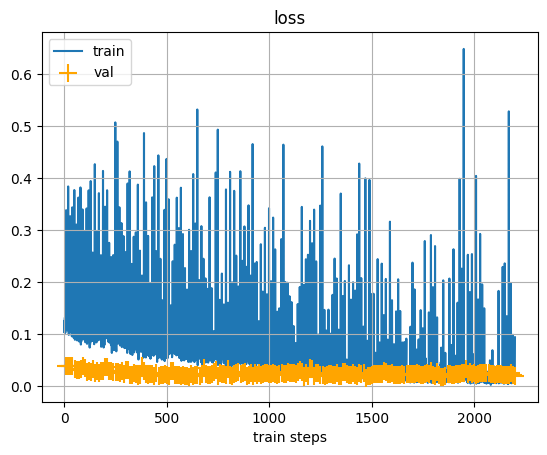

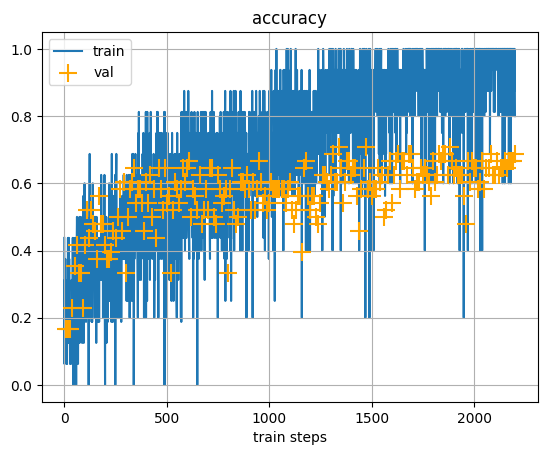

Train loss: 0.022696275264024734
Train acc: 0.875
Val loss: 0.020435331389307976
Val acc: 0.6875


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

In [ ]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

21050070

Medium model, 5 blocks

In [ ]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #3block
    nn.Conv2d(64, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(128, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #4block
    nn.Conv2d(128, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(256, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #5block
    #6block
    #7block
    nn.Flatten(),
    nn.Linear(256 * 8 * 8, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(128, 6),
)

In [ ]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

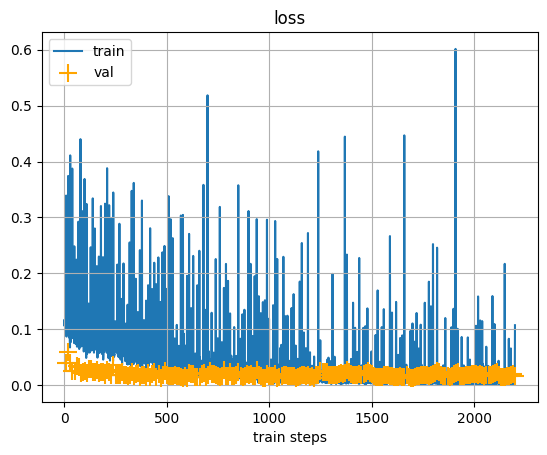

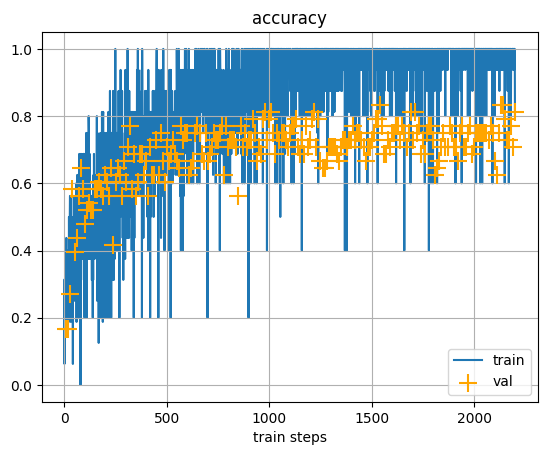

Train loss: 0.01661861501634121
Train acc: 0.90625
Val loss: 0.01639224961400032
Val acc: 0.8125


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

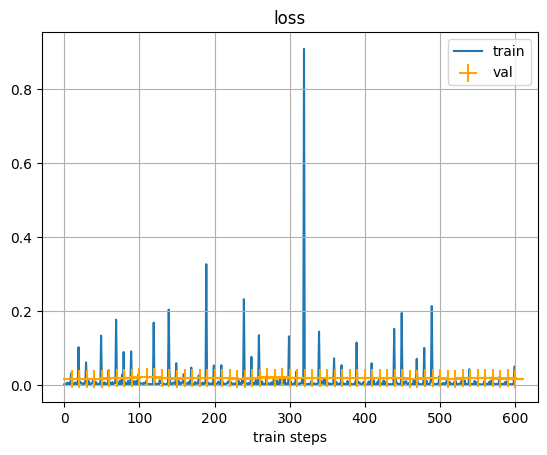

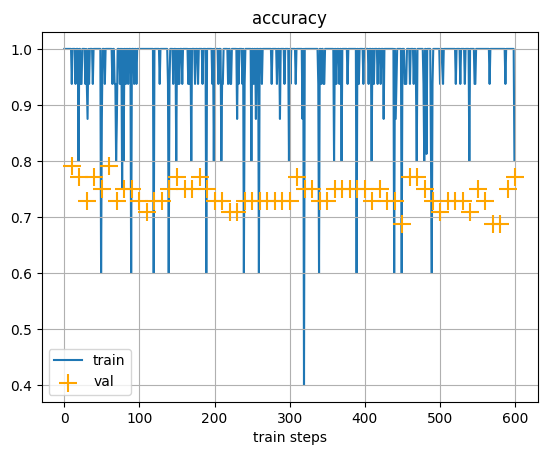

Train loss: 0.007144969888031483
Train acc: 0.925000011920929
Val loss: 0.01767565682530403
Val acc: 0.7708333134651184


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=60)

In [ ]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

9637590

Small model

In [ ]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #3block
    #4block
    #5block
    #6block
    #7block
    nn.Flatten(),
    nn.Linear(64 * 8 * 8, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(128, 6),
)

In [ ]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

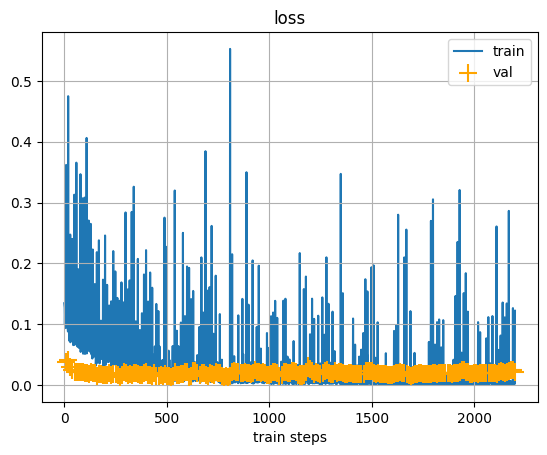

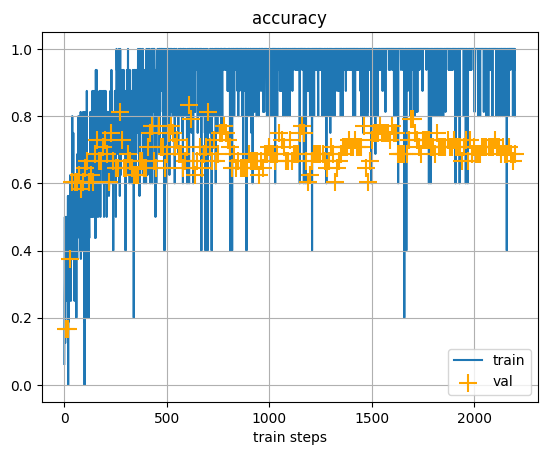

Train loss: 0.016535397619009018
Train acc: 0.9125000238418579
Val loss: 0.021483873948454857
Val acc: 0.6875


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

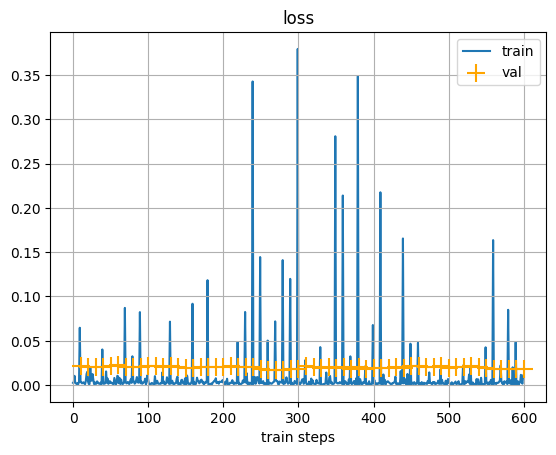

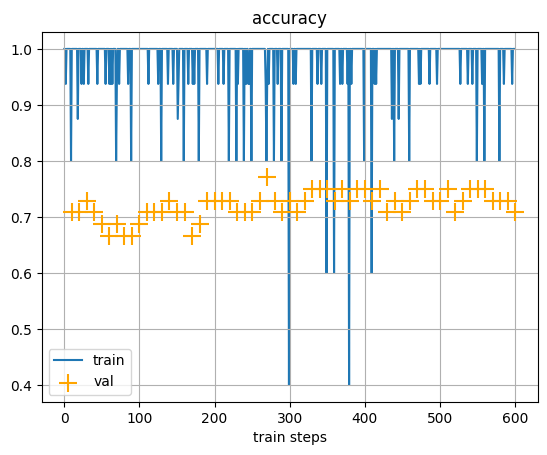

Train loss: 0.004309953190386295
Train acc: 0.925000011920929
Val loss: 0.018316498026251793
Val acc: 0.7083333134651184


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=60)

In [ ]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

2237910

Experiments with medium model

1 fully-conected layer

In [19]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #3block
    nn.Conv2d(64, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(128, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #4block
    nn.Conv2d(128, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(256, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #5block
    #6block
    #7block
    nn.Flatten(),
    nn.Linear(256 * 8 * 8, 6),
)

In [20]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

1279062

In [ ]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

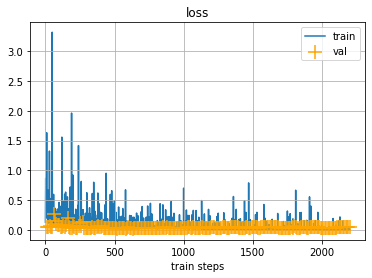

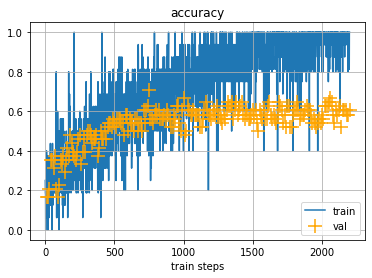

Train loss: 0.0076827495358884335
Train acc: 0.8999999761581421
Val loss: 0.0514252744615078
Val acc: 0.6041666865348816


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

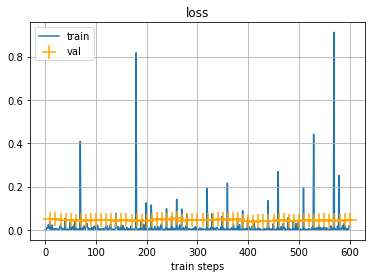

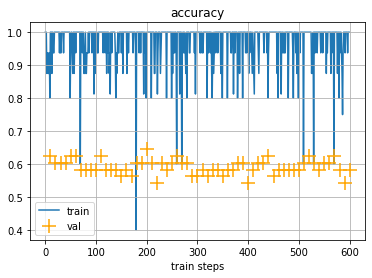

Train loss: 0.005913097411394119
Train acc: 0.918749988079071
Val loss: 0.04654413461685181
Val acc: 0.5833333134651184


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=60)

2 fully-connected

In [31]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #3block
    nn.Conv2d(64, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(128, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #4block
    nn.Conv2d(128, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(256, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #5block
    #6block
    #7block
    nn.Flatten(),
    nn.Linear(256 * 8 * 8, 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(128, 6)
)

In [22]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

3279062

In [32]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

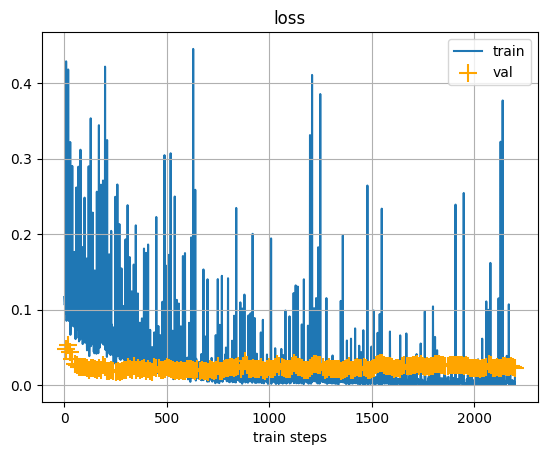

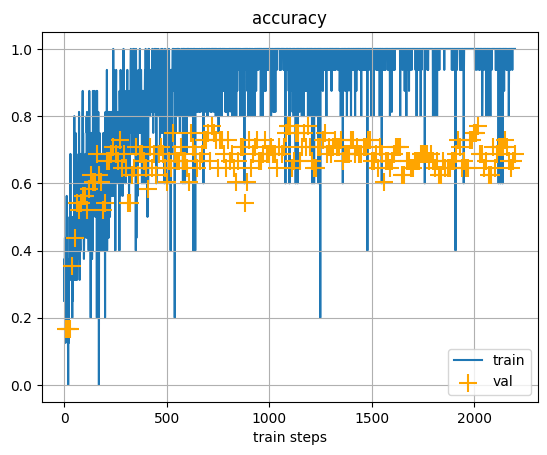

Train loss: 0.0037523035425692797
Train acc: 0.9312499761581421
Val loss: 0.02325923554599285
Val acc: 0.6875


In [33]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

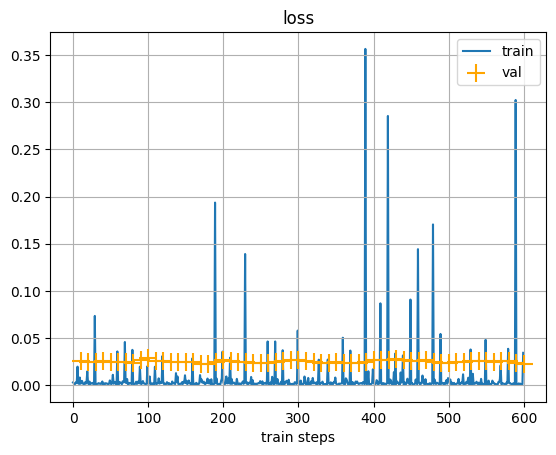

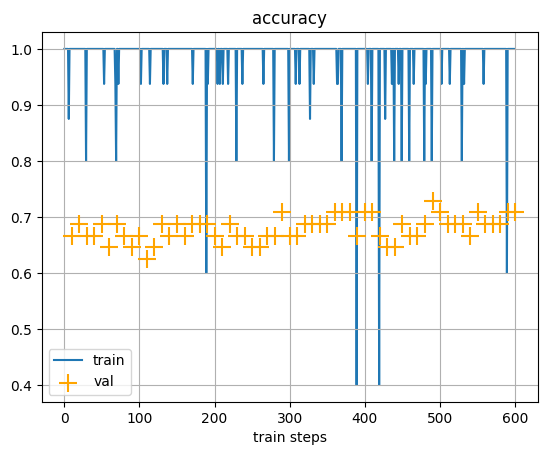

Train loss: 0.004421717952936888
Train acc: 0.9312499761581421
Val loss: 0.022563626989722252
Val acc: 0.7083333134651184


In [34]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=60)

+1 maxpool and 3 fully-connected

In [23]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #3block
    nn.Conv2d(64, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(128, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #4block
    nn.Conv2d(128, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(256, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #5block
    #6block
    #7block
    nn.Flatten(),
    nn.Linear(256 * 4 * 4, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(128, 6),
)

In [24]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

3346134

In [ ]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

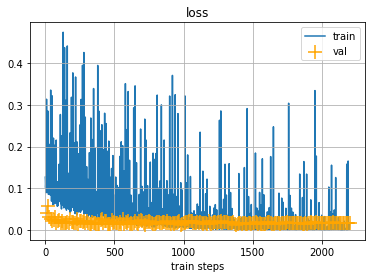

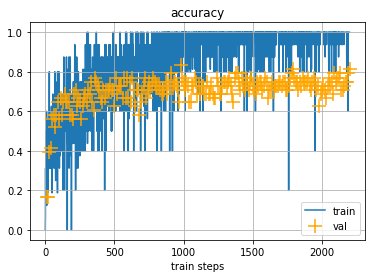

Train loss: 0.004565772134810686
Train acc: 0.9312499761581421
Val loss: 0.01684247888624668
Val acc: 0.8125


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

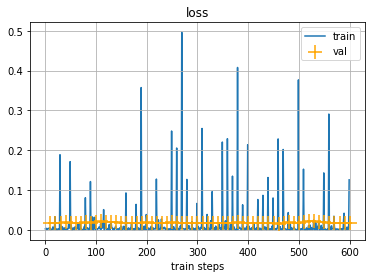

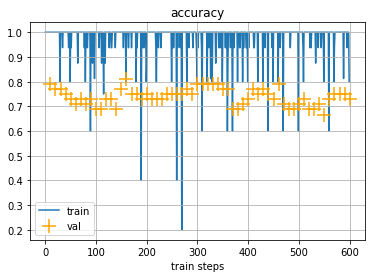

Train loss: 0.015306180343031883
Train acc: 0.918749988079071
Val loss: 0.018871964886784554
Val acc: 0.7291666865348816


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=60)

4 fully-connected + 1 maxpool

In [25]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #3block
    nn.Conv2d(64, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(128, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #4block
    nn.Conv2d(128, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(256, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #5block
    nn.Flatten(),
    nn.Linear(256 * 4 * 4, 1024),
    nn.BatchNorm1d(1024),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(1024, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(128, 6),
)

In [26]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

5970646

In [ ]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

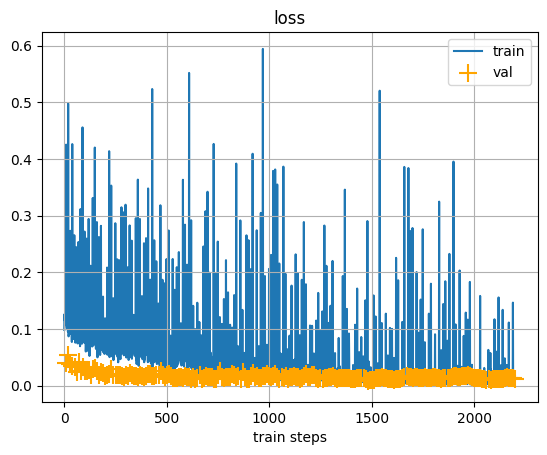

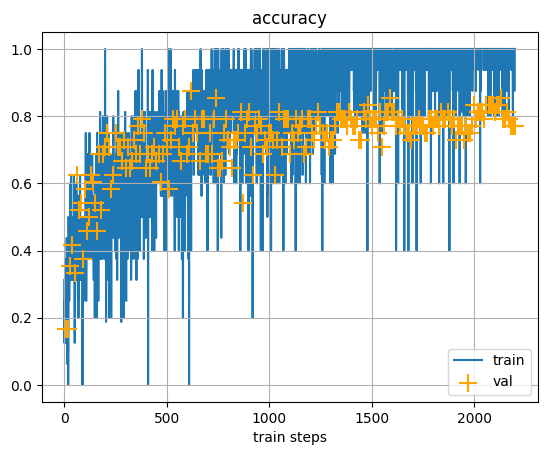

Train loss: 0.007410609629005194
Train acc: 0.9125000238418579
Val loss: 0.01148288231343031
Val acc: 0.7708333134651184


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

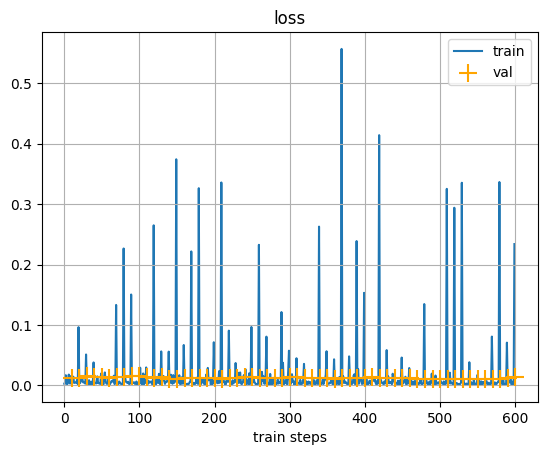

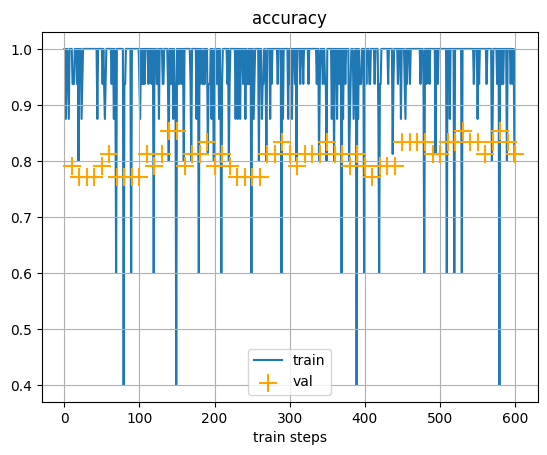

Train loss: 0.027498703449964523
Train acc: 0.9125000238418579
Val loss: 0.013574236072599888
Val acc: 0.8125


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=60)

In [ ]:
torch.save(model.state_dict(), '1best')

+2 maxpool к исходному, 4 fully-connected

In [27]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #3block
    nn.Conv2d(64, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(128, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #4block
    nn.Conv2d(128, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(256, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #5block
    #6block
    #7block
    nn.Flatten(),
    nn.Linear(256 * 2 * 2, 1024),
    nn.BatchNorm1d(1024),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(1024, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(128, 6),
)

In [28]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

2824918

In [ ]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

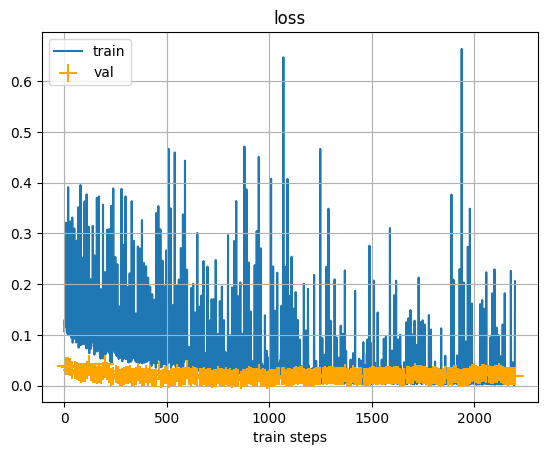

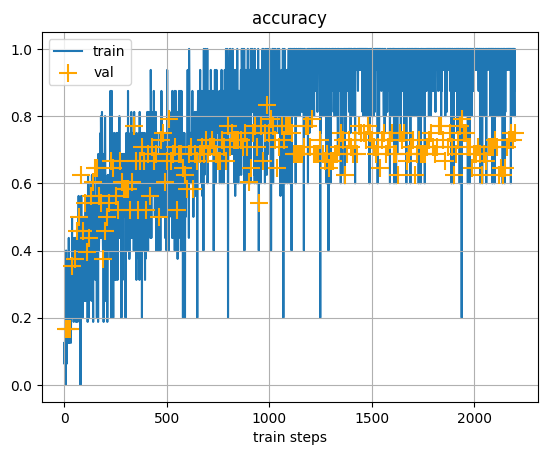

Train loss: 0.02624456211924553
Train acc: 0.90625
Val loss: 0.01925411820411682
Val acc: 0.75


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

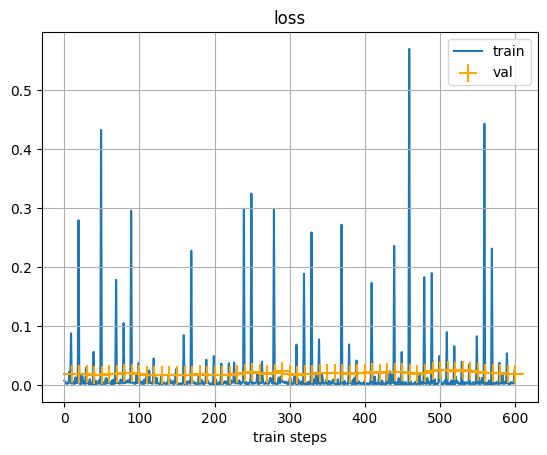

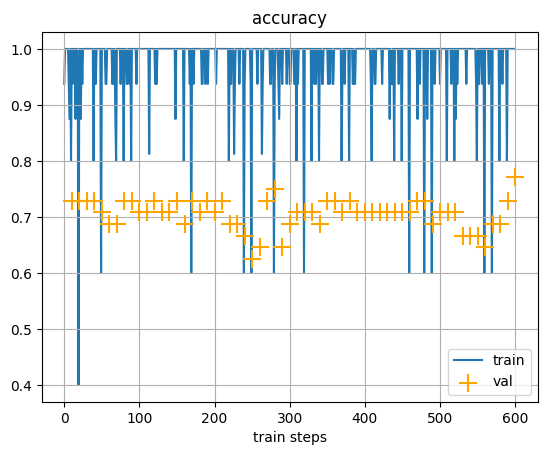

Train loss: 0.005765524692833424
Train acc: 0.9312499761581421
Val loss: 0.018799182027578354
Val acc: 0.7708333134651184


In [ ]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=60)

0 maxpool 4 fully-connected

In [29]:
model = nn.Sequential(
    nn.Conv2d(3, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.Conv2d(16, 16, 3, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #1block
    nn.Conv2d(16, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(32, 32, 3, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #2block
    nn.Conv2d(32, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.Conv2d(64, 64, 3, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #3block
    nn.Conv2d(64, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(128, 128, 3, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #4block
    nn.Conv2d(128, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(256, 256, 3, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    #nn.Dropout(0.4),
    #5block
    #6block
    #7block
    nn.Flatten(),
    nn.Linear(256 * 8 * 8, 1024),
    nn.BatchNorm1d(1024),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(1024, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(128, 6),
)

In [30]:
sum([p.numel() for p in model.parameters() if p.requires_grad])

18553558

In [16]:
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters())
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.99)

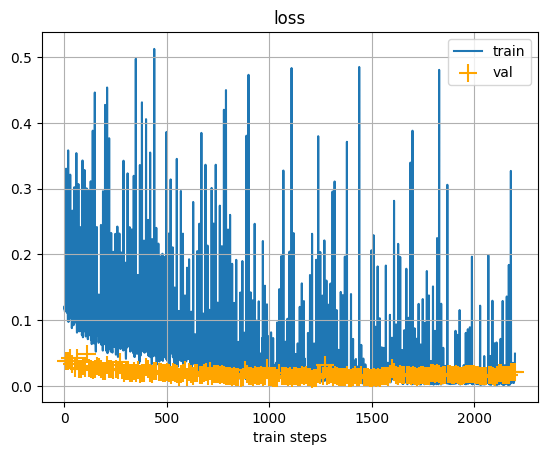

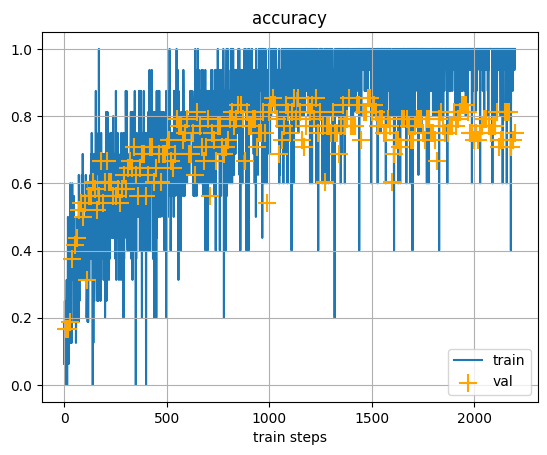

Train loss: 0.013403470627963543
Train acc: 0.8999999761581421
Val loss: 0.020513609051704407
Val acc: 0.75


In [17]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=220)

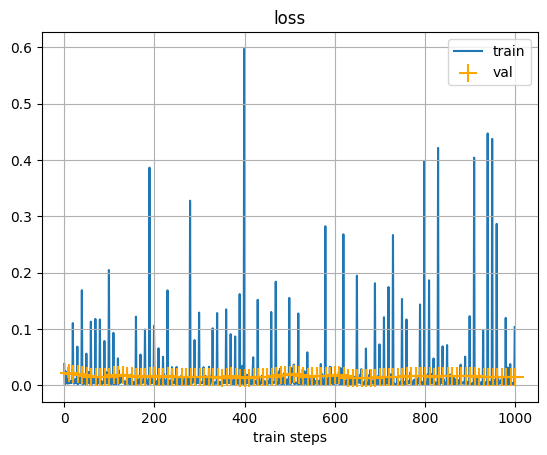

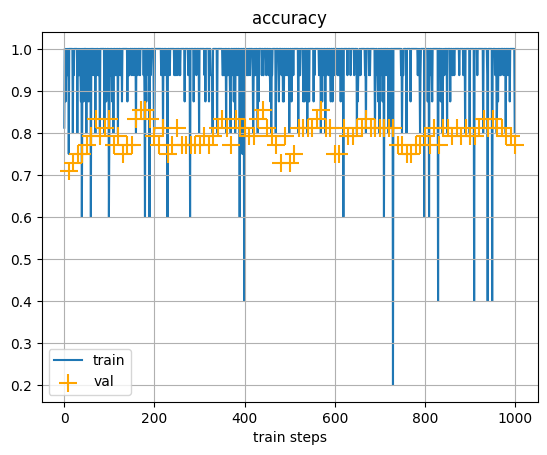

Train loss: 0.013202419504523277
Train acc: 0.925000011920929
Val loss: 0.015430032275617123
Val acc: 0.7708333134651184


In [18]:
train(model, criterion, optimizer, train_dataloader, val_dataloader, scheduler, n_epochs=100)